# Manifold learning with Feature-type distributed clustering workflow is more informative compared to UMAP for tabular clinical datasets

## Importing necessary libraries

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
from tensorflow import keras
import umap.umap_ as umap
%config InlineBackend.figure_format = 'svg'



## Importing pre-processed data

In [2]:
np.random.seed(42)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
data=pd.read_csv('Preprocessed_DM_xx.csv')


In [3]:
np.random.seed(42)
data=data.sample(frac=1) #Shuffle the data set

## Feature engineering

- Creating new feature called hypertension
- Filtering unnecessary details 

In [4]:
np.random.seed(42)
HTN_indexes=data.loc[(data['Currently.taking.a.prescribed.medicine.to.lower.BP'] != 0) | (data['First.SYSTOLIC.reading'] >= 140) | (data['First.DIASTOLIC.reading'] >= 90) ].index.values
HTN_cols=np.zeros(data.shape[0])
HTN_cols[[HTN_indexes]]=1
data['HTN']=HTN_cols
data=data.drop(["First.SYSTOLIC.reading","First.DIASTOLIC.reading","Currently.taking.a.prescribed.medicine.to.lower.BP"], axis=1)
data=data.reset_index(drop=True)
data.columns
data=data.drop(["Hb_adjust_alt_smok","Second.SYSTOLIC.reading","Second.DIASTOLIC.reading","Third.SYSTOLIC.reading","Third.DIASTOLIC.reading","Hb_status","Glucose.level",'SBP_status'], axis=1)
data=data.loc[data['BMI'] != 99.99]
data=data.loc[data['Hemoglobin.level..g.dl...1.decimal.'] != 99.99]
data=data.loc[data['Currently.has.asthma'] != .5]
data=data.loc[data['Currently.has.thyroid.disorder'] != .5]
data=data.loc[data['Currently.has.heart.disease'] != .5]
data=data.loc[data['Currently.has.cancer'] != .5]
data=data.loc[data['DM_history'] == 1]
data=data.loc[data['Type.of.caste.or.tribe.of.the.household.head'] != 0]
data=data.loc[data['Time.to.get.to.water.source..minutes.'] != -1]
data=data.drop(["Unnamed: 0","DM_status","DM_history"], axis=1)

In [5]:
np.random.seed(42)
i=[x for x in range(10125)]

data.set_index(pd.Series(i), inplace=True) # Reset the index

In [6]:
data.shape

(10125, 41)

## UMAP on original data

In [7]:
from fdc.fdc import feature_clustering
from fdc.fdc import canberra_modified
modified_can = canberra_modified
from fdc.fdc import FDC, Clustering

In [8]:
ord_list=['Drinks.alcohol', 'Smoking_stat','Has.refrigerator',
       'Has.bicycle', 'Has.motorcycle.scooter', 'Has.car.truck', 'Owns.livestock..herds.or.farm.animals','Frequency.takes.milk.or.curd',
       'Frequency.eats.pulses.or.beans',
       'Frequency.eats.dark.green.leafy.vegetable', 'Frequency.eats.fruits',
       'Frequency.eats.eggs', 'Frequency.eats.fish',
       'Frequency.eats.chicken.or.meat', 'Frequency.eats.fried.food',
       'Frequency.takes.aerated.drinks','Frequency.household.members.smoke.inside.the.house','Wealth.index',
       'Highest.educational.level','Currently.has.asthma',
       'Currently.has.thyroid.disorder', 'Currently.has.heart.disease',
       'Currently.has.cancer', 'Suffers.from.TB','HTN' ]
cont_list=['Current.age','BMI','Hemoglobin.level..g.dl...1.decimal.','Time.to.get.to.water.source..minutes.']
nom_list=['Household.head.s.religion', 'Sex', 'Type.of.place.of.residence', 'Household.structure',
       'Type.of.caste.or.tribe.of.the.household.head','Type.of.cooking.fuel','Source.of.drinking.water']

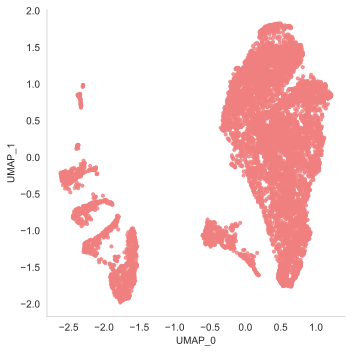

In [9]:
umap_emb=feature_clustering(15,0.1,'euclidean',data,True)

## Silhouette_score  and Dunn index for umap clusters extracted using K-means clustering

In [10]:
from fdc.clustering import Clustering

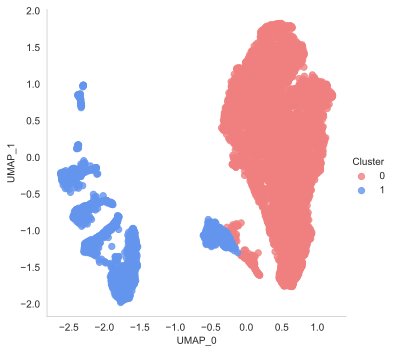

In [11]:
umap_clustering=Clustering(umap_emb,umap_emb,True)
umap_cluster_list,umap_cluster_counts=umap_clustering.K_means(2)

In [12]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score
from cluster_val import *

In [13]:
silhouette_score(umap_emb, umap_cluster_list, metric='euclidean')

0.5998863206501435

In [14]:
Silhouette_visual(umap_emb)

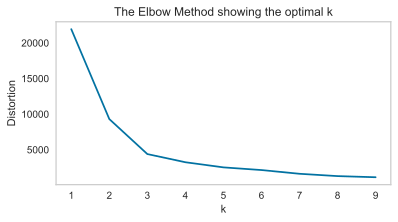

In [15]:
elbow_plot(umap_emb)

In [16]:
dunn_index(cluster_wise_df(umap_emb,umap_cluster_list))

0.00287162771413835

## Silhouette_score  and Dunn index for umap clusters extracted using Agglomerative clustering

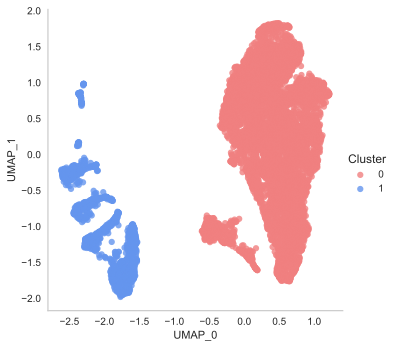

In [17]:
umap_cluster_list_agglo,umap_cluster_counts_agglo=umap_clustering.Agglomerative(2,'euclidean','ward')

In [18]:
silhouette_score(umap_emb, umap_cluster_list_agglo, metric='euclidean')

0.6148981607281019

In [19]:
dunn_index(cluster_wise_df(umap_emb,umap_cluster_list_agglo))

0.2598093251538023

## Silhouette_score  and Dunn index for umap clusters extracted using DBSCAN clustering

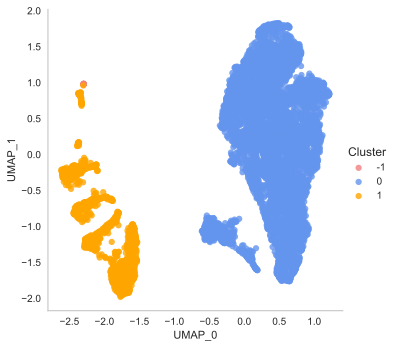

In [20]:
umap_cluster_list_dbscan,umap_cluster_counts_dbscan=umap_clustering.DBSCAN(0.8,160)

In [21]:
#removing noise indices from the embeddings
non_noise_indices= np.where(np.array(umap_cluster_list_dbscan)!=-1)
umap_emb= umap_emb.iloc[non_noise_indices]
#FDC_emb_low= FDC_emb_low.iloc[non_noise_indices]
umap_cluster_list_dbscan= np.array(umap_cluster_list_dbscan)[non_noise_indices]


In [22]:
silhouette_score(umap_emb, umap_cluster_list_dbscan, metric='euclidean')

0.6153916171327859

In [23]:
dunn_index(cluster_wise_df(umap_emb,umap_cluster_list_dbscan))

0.2598093251538023

## Dividing features
- ord_list=ordinal features
- cont_list=continueous features
- nom_list=nominal features

In [24]:
ord_list=['Drinks.alcohol', 'Smoking_stat','Has.refrigerator',
       'Has.bicycle', 'Has.motorcycle.scooter', 'Has.car.truck', 'Owns.livestock..herds.or.farm.animals','Frequency.takes.milk.or.curd',
       'Frequency.eats.pulses.or.beans',
       'Frequency.eats.dark.green.leafy.vegetable', 'Frequency.eats.fruits',
       'Frequency.eats.eggs', 'Frequency.eats.fish',
       'Frequency.eats.chicken.or.meat', 'Frequency.eats.fried.food',
       'Frequency.takes.aerated.drinks','Frequency.household.members.smoke.inside.the.house','Wealth.index',
       'Highest.educational.level','Currently.has.asthma',
       'Currently.has.thyroid.disorder', 'Currently.has.heart.disease',
       'Currently.has.cancer', 'Suffers.from.TB','HTN' ]
cont_list=['Current.age','BMI','Hemoglobin.level..g.dl...1.decimal.','Time.to.get.to.water.source..minutes.']
nom_list=['Household.head.s.religion', 'Sex', 'Type.of.place.of.residence', 'Household.structure',
       'Type.of.caste.or.tribe.of.the.household.head','Type.of.cooking.fuel','Source.of.drinking.water']

In [25]:
len(ord_list)

25

In [26]:
len(nom_list)

7

In [27]:
len(cont_list)

4

## FDC on original data

In [28]:
from fdc.fdc import feature_clustering
from fdc.fdc import FDC, Clustering
from fdc.fdc import canberra_modified
modified_can = canberra_modified

FDC.normalize (init): 0.00000 / 0.000s
FDC.normalize (clustering CONT): 7.06250 / 7.062s
FDC.normalize (clustering ORD): 80.18750 / 87.250s
FDC.normalize (clustering NOM): 63.71875 / 150.969s
FDC.normalize (concat): 0.00000 / 150.969s
FDC.normalize (umap 5 -> 2): 7.68750 / 158.656s
FDC.normalize (array -> DataFrame): 0.00000 / 158.656s


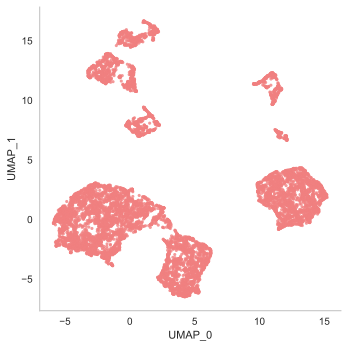

FDC.normalize (plotting): 1.45312 / 160.109s
FDC.normalize (array -> DataFrame): 0.00000 / 160.109s
FDC.normalize (total): 0.00000 / 160.109s


In [29]:
fdc = FDC(clustering_cont=Clustering('euclidean')
          , clustering_ord=Clustering(modified_can)
          , clustering_nom=Clustering('hamming', max_components=1)
          , visual=True
          , use_pandas_output=True
          , with_2d_embedding=True
          )

fdc.selectFeatures(continueous=cont_list, nomial=nom_list, ordinal=ord_list)

FDC_emb_high,FDC_emb_low = fdc.normalize(data,n_neighbors=15, min_dist=0.1,cont_list=cont_list, nom_list=nom_list, ord_list=ord_list,
                  with_2d_embedding=True,
                  visual=True)

## Silhouette_score  and Dunn index for fdc clusters extracted (intermediate_dim) using K-means clustering

In [30]:
from fdc.clustering import Clustering

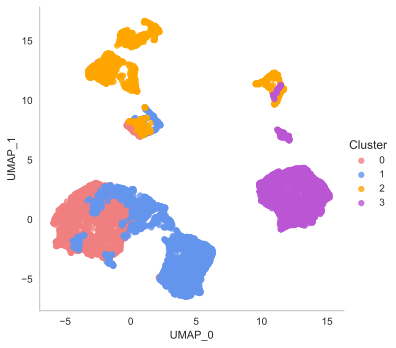

In [31]:
clustering=Clustering(FDC_emb_high,FDC_emb_low,True)
cluster_list,cluster_counts=clustering.K_means(4)

In [32]:
FDC_emb_high['Cluster'] = cluster_list

In [33]:
silhouette_score(FDC_emb_high, cluster_list, metric='euclidean')

0.3288029395347771

In [34]:
dunn_index(cluster_wise_df(FDC_emb_high,cluster_list))

0.025345964140981916

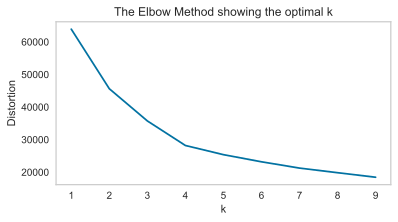

In [35]:
elbow_plot(FDC_emb_high)

In [36]:
Silhouette_visual(FDC_emb_high)


## Silhouette_score  and Dunn index for fdc clusters extracted (intermediate_dim) using Agglomerative clustering

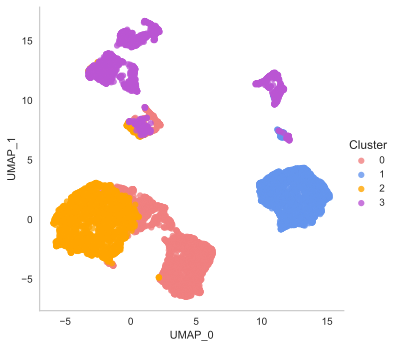

In [37]:
cluster_list_agglo,cluster_counts_agglo=clustering.Agglomerative(4,'euclidean','ward')

In [38]:
FDC_emb_high['Cluster'] = cluster_list_agglo

In [39]:
silhouette_score(FDC_emb_high, cluster_list_agglo, metric='euclidean')

0.3380953282602711

In [40]:
dunn_index(cluster_wise_df(FDC_emb_high,cluster_list_agglo))

0.02831773013366899

## Silhouette_score  and Dunn index for fdc clusters extracted (intermediate_dim) using DBSCAN clustering

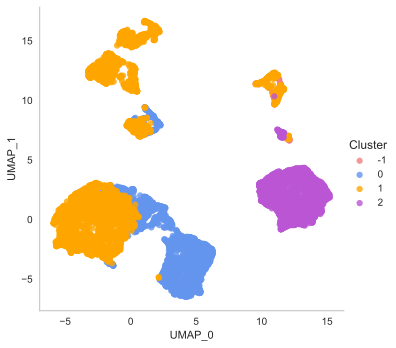

In [41]:
cluster_list_dbscan,cluster_counts_dbscan=clustering.DBSCAN(1.2,150)

In [42]:
FDC_emb_high['Cluster'] = cluster_list_dbscan

In [43]:
#removing noise indices from the embeddings
non_noise_indices= np.where(np.array(cluster_list_dbscan)!=-1)
FDC_emb_high= FDC_emb_high.iloc[non_noise_indices]
FDC_emb_low= FDC_emb_low.iloc[non_noise_indices]
cluster_list_dbscan= np.array(cluster_list_dbscan)[non_noise_indices]


In [44]:
silhouette_score(FDC_emb_high, cluster_list_dbscan, metric='euclidean')

0.23610559265550585

In [45]:
dunn_index(cluster_wise_df(FDC_emb_high,cluster_list_dbscan))

0.02337308233223535